In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"
from IPython.display import display, Image
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)

In [2]:
import numpy as np
import pandas as pd
from BITS.utils import load_pickle, save_pickle

In [3]:
dir_name = "develop/dmel_all"

In [4]:
db_file = f"{dir_name}/DMEL.db"
las_file = f"{dir_name}/TAN.DMEL.las"
out_dir = f"{dir_name}/tmp"

#gepard_root = "/work2/yoshihiko_s/software/gepard/"   # hx
#gepard_root = "/Users/yoshihikosuzuki/software/gepard/"   # local
gepard_root = "/home/ysuzuki/work/software/gepard/"   # falcon
gepard_jar = gepard_root + "dist/Gepard-1.40.jar"
gepard_mat = gepard_root + "resources/matrices/edna.mat"
gepard_command = f"java -cp {gepard_jar} org.gepard.client.cmdline.CommandLine -matrix {gepard_mat}"

In [5]:
repr_units = pd.read_csv(f"{dir_name}/repr_units", sep='\t', index_col=[0, 1])
tr_reads = pd.read_csv(f"{dir_name}/tr_reads", sep='\t', index_col=0)
pf = load_pickle(f"{dir_name}/peaks_finder.pkl")
encodings = load_pickle(f"{dir_name}/encodings.pkl")
overlaps = load_pickle(f"{dir_name}/overlaps.pkl")
o = load_pickle(f"{dir_name}/overlap_obj.pkl")

In [31]:
# v for self-vs-self read plots and d for dot plot between two different reads
from datruf import Viewer
from BITS.seq import DotPlot
v = Viewer(db_file, las_file, out_dir, gepard_command, encodings)
d = DotPlot(out_dir, gepard_command)

## Representative units construction (= clustering by global sequence similarity)

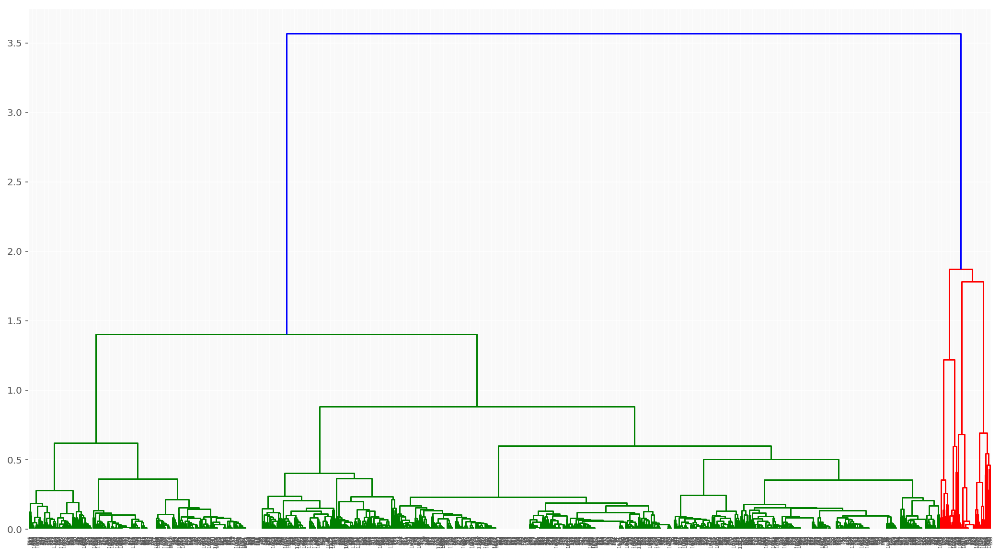

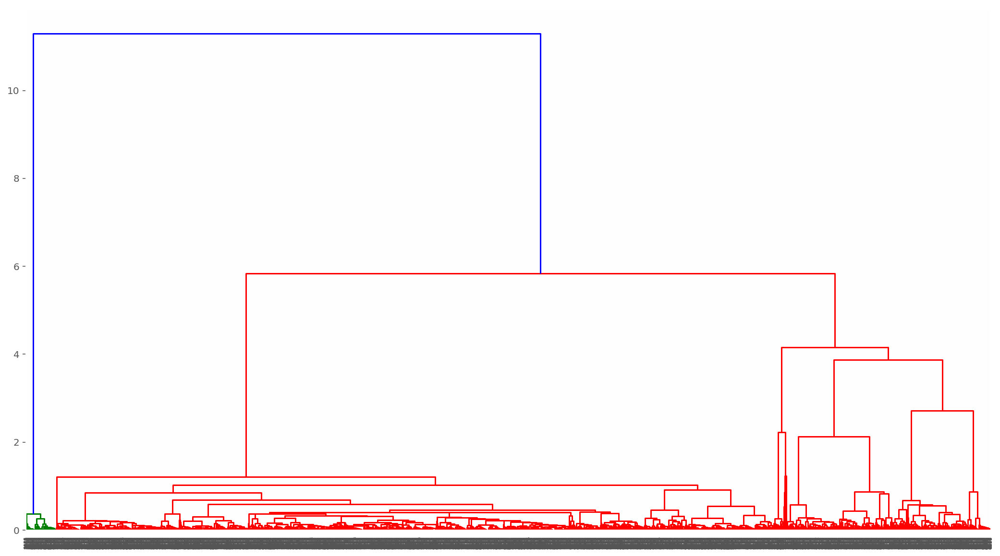

In [28]:
for peak in pf.peaks:
    peak.cl_master.dendrogram()

In [6]:
for peak in pf.peaks:
    peak.cl_master.plot_tsne()

In [7]:
repr_units

cluster_id  cluster_size  length  \
peak_id repr_id                                     
0       0                 1           272     117   
        1                 2           792     117   
        2                 6            21     123   
        3                 7            19      98   
1       0                 1           303     364   
        1                 3          7136     359   
        2                 7            99     356   
        3                12           521     360   
        4                13           359     359   
        5                14            98     357   
        6                16           736     351   
        7                18           156     347   

                                                          sequence  
peak_id repr_id                                                     
0       0        ttgaaatcgaaaaatcacccattttgaccgcttaaaatgacataac...  
        1        ttgaaatcggaaaatcacccattttgaccgcttaaaatgacataac...  
        2        gtactttcggttgttgtggacgtcgaactttcagtggaagttgtcg...  
        3        gttattctatgttattctatgttattctatgttattctatgttatt...  
1       0        ccatagactgaaatagactgtttttgtaccattgggttttagatat...  
        1        gaatgtcatacctcactgagctcgtaataaaatttccaatcaaact...  
        2        gaaatgccatacctcgttgaattcgtaacaaaattccccatcgacc...  
        3        gaatgccatacctcgttgagctcgtaataaaatttccaatcaaact...  
        4        gaatgccgtacctcgttgagctcgtaataaaatttccaatcaaact...  
        5        gaatgccgtacctcgttgagctcgtaataaaatttccaatcaaact...  
        6        gaatctcatacctcgctgagctcgtaattaaatttccaatcaaact...  
        7        gaatgtcatacatcgctgagctcgtaattaaatttacaattaaaat...

## Representative units comparison

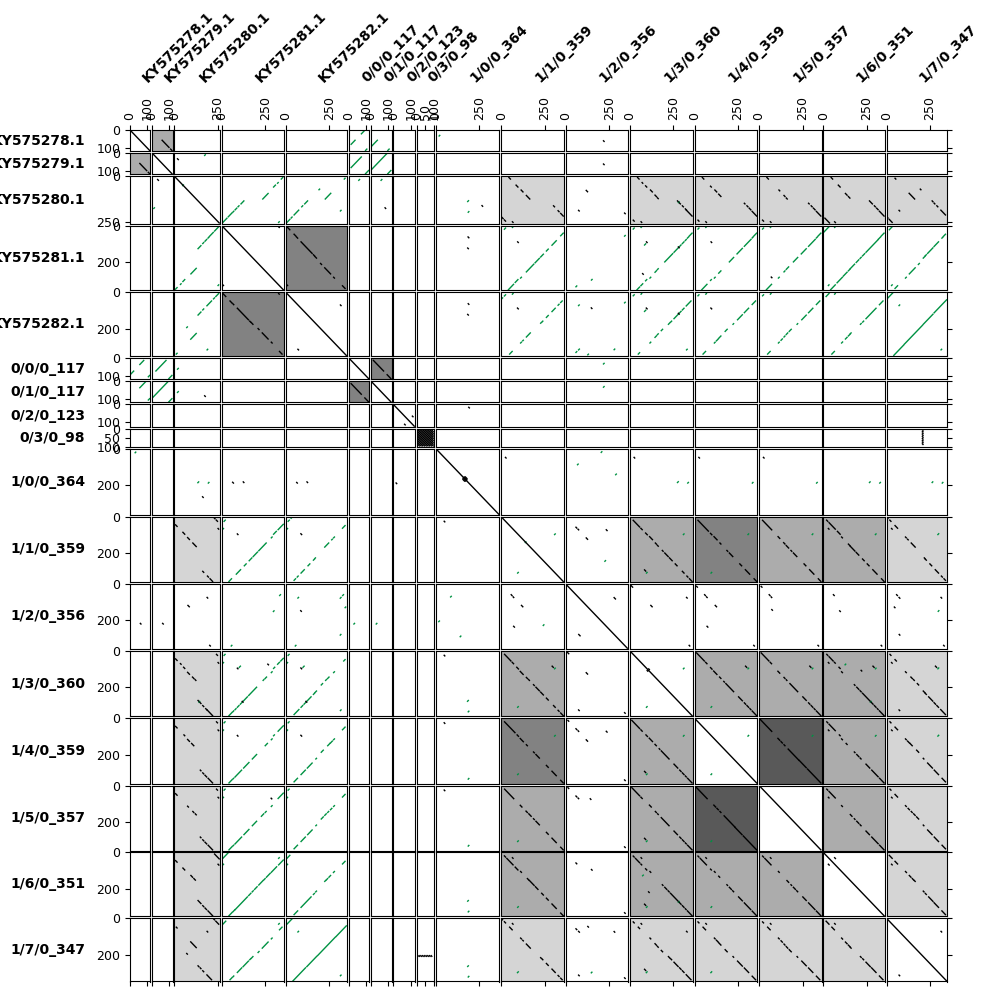

In [13]:
Image("./develop/dmel_all/Polydotplot_wordsize10_5shades_ref0_ori0.png")

In [6]:
from dacmaster.clustering import ClusteringSeqs

In [7]:
# Global sequence dissimilaririty among the representative units
c = ClusteringSeqs(repr_units["sequence"].reset_index(drop=True))
c.calc_dist_mat()
c.plot_heatmap()

[I 190212 16:50:58 utils:46] Starting distance matrix calculation (args=(<dacmaster.clustering.ClusteringSeqs object at 0x7f38d3e3ef60>,), kwds={})
[D 190212 16:50:58 clustering:212] Starting row 0-9
[D 190212 16:50:58 clustering:206] Finished @ row 0
[D 190212 16:50:58 clustering:206] Finished @ row 1
[D 190212 16:50:58 clustering:206] Finished @ row 2
[D 190212 16:50:58 clustering:206] Finished @ row 3
[D 190212 16:50:58 clustering:206] Finished @ row 4
[D 190212 16:50:58 clustering:206] Finished @ row 5
[D 190212 16:50:58 clustering:206] Finished @ row 6
[D 190212 16:50:58 clustering:206] Finished @ row 7
[D 190212 16:50:58 clustering:206] Finished @ row 8
[D 190212 16:50:58 clustering:212] Starting row 9-11
[D 190212 16:50:58 clustering:206] Finished @ row 9
[D 190212 16:50:58 clustering:206] Finished @ row 10
[I 190212 16:50:58 utils:48] Finished distance matrix calculation


## Unit classification by variants

Actually units are not clustered, but these plots are useful for checking whether or not the variant sites defined on a representative unit have enough power to separate the units belonging to the representative class into sub-classes (i.e. power to find unique overlaps).

In [6]:
from dacmaster.clustering import ClusteringVarMat

In [7]:
import random

In [8]:
max_N = 3000
for (peak_id, repr_id), df in repr_units.iterrows():
    c = ClusteringVarMat(f"develop/dmel_all/consed_out/peak_{peak_id}_repr_{repr_id}.raw_units.t0.15.consed.V")
    if c.N > max_N:   # sub-sample only <max_N> data for too large classes
        sub = random.sample(list(range(c.N)), max_N)
        c.data = c.data[sub]
        c.N = max_N
        c.assignment = c.assignment[sub]
    c.calc_dist_mat()
    c.plot_tsne()

In [33]:
# num of variant sites detected for each representative class
!(for DATA in develop/dmel_all/consed_out/peak_*_repr_*.raw_units.t0.15.consed.V; do wc -l ${DATA}; done)

18 develop/dmel_all/consed_out/peak_0_repr_0.raw_units.t0.15.consed.V
21 develop/dmel_all/consed_out/peak_0_repr_1.raw_units.t0.15.consed.V
18 develop/dmel_all/consed_out/peak_0_repr_2.raw_units.t0.15.consed.V
8 develop/dmel_all/consed_out/peak_0_repr_3.raw_units.t0.15.consed.V
38 develop/dmel_all/consed_out/peak_1_repr_0.raw_units.t0.15.consed.V
67 develop/dmel_all/consed_out/peak_1_repr_1.raw_units.t0.15.consed.V
72 develop/dmel_all/consed_out/peak_1_repr_2.raw_units.t0.15.consed.V
72 develop/dmel_all/consed_out/peak_1_repr_3.raw_units.t0.15.consed.V
51 develop/dmel_all/consed_out/peak_1_repr_4.raw_units.t0.15.consed.V
64 develop/dmel_all/consed_out/peak_1_repr_5.raw_units.t0.15.consed.V
62 develop/dmel_all/consed_out/peak_1_repr_6.raw_units.t0.15.consed.V
77 develop/dmel_all/consed_out/peak_1_repr_7.raw_units.t0.15.consed.V


## Example of encoded reads and alignment between them

In [6]:
from dalayout.graph import Overlap

In [7]:
read_i, read_j = 386460, 57412   # to be plotted and aligned

In [34]:
v.show(read_i)
v.show(read_j)

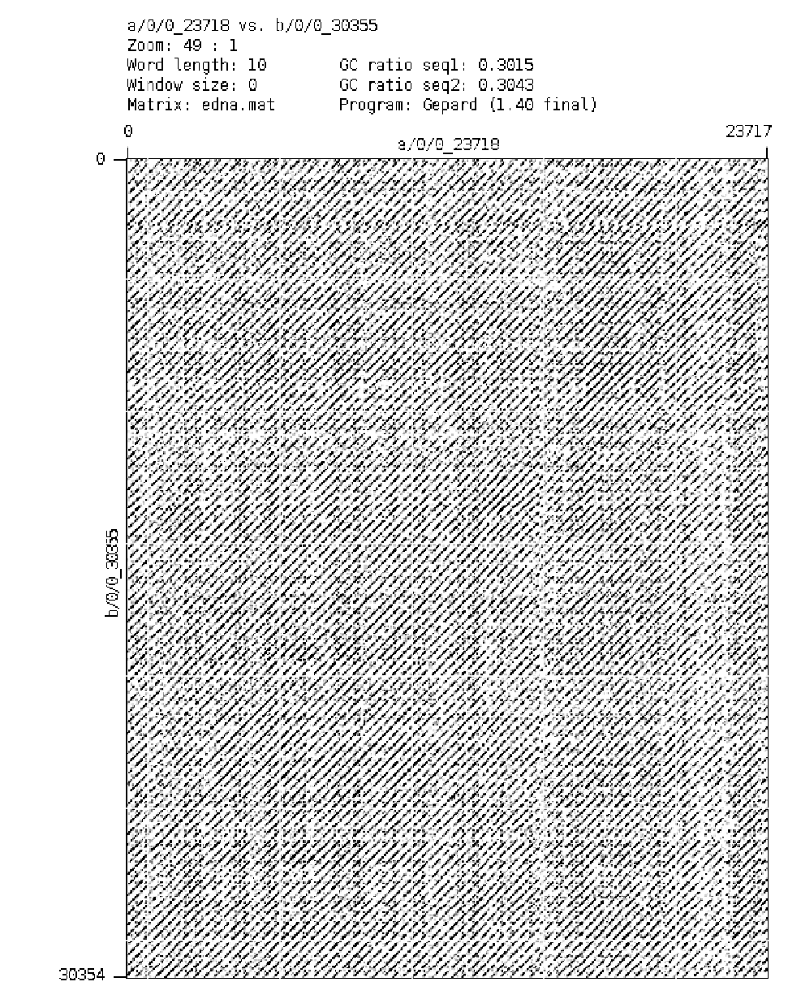

In [35]:
# Dot plot with nucleotides
d.plot(tr_reads.loc[read_i, "sequence"], tr_reads.loc[read_j, "sequence"])

In [8]:
o = Overlap(encodings, varvec_colname="var_vec_global0.15")

In [9]:
# Distance matrix (corresponding to dot plot) and DP matrix
ret = o.svs_read_alignment(read_i, read_j, 'r', plot=True)

## Read classification by composition of representative units

In [6]:
from dacmaster.clustering import ClusteringNumeric

In [7]:
# base for the "representative composition vector" of a read
vec_base = [(*v, strand) for v in repr_units.index.values for strand in [0, 1]]

def comp_to_vec(comp, normalize=True):
    ret = np.array([comp[k] for k in vec_base])
    return ret if not normalize else ret / np.sum(ret)

In [12]:
comps = sorted(o.comps.items())
c = ClusteringNumeric(np.array([comp_to_vec(v) for k, v in comps]), [k for k, v in comps])
c.do_clustering("kmeans", n_clusters=30)
c.calc_dist_mat()
c.plot_tsne()

In the plot above, circle-shaped clusters are mono-source and linear-shaped clusters are multi-source (= reads are mixture of multiple representative units).

Note that the number of clusters specified below should be redundant (i.e. sufficiently large), or use a clustering method which does not require it.

In [10]:
# consensus composition vector for each cluster
ret = [(cluster_id, np.sum(cluster_data, axis=0) / np.sum(cluster_data)) for cluster_id, cluster_data in c.clusters()]

In [13]:
trace = go.Heatmap(x=[str(v) for v in vec_base],
                   y=[f"cluster {r[0]}" for r in ret],
                   z=[r[1] for r in ret],
                   colorscale="YlGnBu",
                   zmin=0,
                   zmax=1,
                   reversescale=True,
                   showscale=False)

layout = go.Layout(width=1000,
                   height=1000,
                   title="Cluster vectors",
                   yaxis=dict(autorange="reversed"))

py.iplot(go.Figure(data=[trace], layout=layout))

In [18]:
# list up clusters consisting of multiple representative units
found = set()   # for removing redundancy
for cluster_id, cluster_vec in ret:
    reprs = tuple([vec_base[i] for i, v in enumerate(cluster_vec) if v >= 0.1])
    if len(reprs) >= 2:
        reprs_rc = tuple([(x[0], x[1], 1- x[2]) for x in reprs])
        if reprs not in found and reprs_rc not in found:
            print(cluster_id, reprs)
            found.add(reprs)
            found.add(reprs_rc)

2 ((1, 4, 0), (1, 5, 0))
6 ((0, 0, 0), (0, 1, 0))
16 ((1, 3, 0), (1, 4, 0))
25 ((1, 1, 0), (1, 1, 1))
29 ((1, 6, 0), (1, 7, 0), (1, 7, 1))


This means that there are regions composed of:

* peak_0_repr_0_forward & peak_0_repr_1_forward
* peak_1_repr_1_forward & peak_1_repr_1_revcomp
* peak_1_repr_3_forward & peak_1_repr_4_forward
* peak_1_repr_4_forward & peak_1_repr_5_forward
* peak_1_repr_6_forward & peak_1_repr_7_forward & peak_1_repr_7_revcomp

## Assembly graph from the encoded reads

In [37]:
from dalayout.graph import construct_string_graph, draw_graph

In [38]:
sg = construct_string_graph(overlaps, repr_units, th_overlap_len=3000, th_mean_score=0.01)

ValueError: not enough values to unpack (expected 3, got 2)

In [ ]:
graph.draw_graph(sg)